In [1]:
from Cost_of_fuel import *

### Load input files

In [2]:
import_path(path = "../project/Chromatin_State_Analysis/Full_pipeline/test_folder/Git-code/Dataset/")

In [3]:
bed_folder_path = '../project/Chromatin_State_Analysis/Full_pipeline/test_folder/Git-code/Dataset/human_factor/'

### Generate semantic annotations

In [4]:
geo_id_list = get_geoids_list(separator="\t", encode_convert=False)

In [ ]:
get_semantic_annotations(geo_id_list)

In [5]:
semantic_df = generate_semantic_df()

[PyGMQL] Note: NumExpr detected 56 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
[PyGMQL] NumExpr defaulting to 8 threads.


### Data Analysis

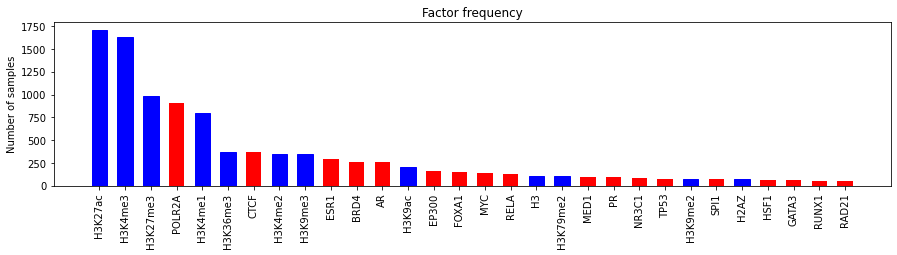

In [6]:
plot_factor_freq(semantic_df, 30)

In [7]:
generate_fixed_factor_pool(semantic_df, ["H3K27me3", "POLR2A", "CTCF"], 5)

+----+-------------------------------------------+--------------------------+
|    | factor_list                               |   n_semantic_annotations |
|----+-------------------------------------------+--------------------------|
|  0 | H3K27me3, POLR2A, CTCF, H3K27ac, H3K4me3  |                       25 |
|  1 | H3K27me3, POLR2A, CTCF, H3K36me3, H3K4me3 |                       23 |
|  2 | H3K27me3, POLR2A, CTCF, H3K4me1, H3K4me3  |                       21 |
|  3 | H3K27me3, POLR2A, CTCF, H3K27ac, H3K4me1  |                       20 |
|  4 | H3K27me3, POLR2A, CTCF, H3K27ac, H3K36me3 |                       17 |
|  5 | H3K27me3, POLR2A, CTCF, H3K4me1, H3K36me3 |                       17 |
|  6 | H3K27me3, POLR2A, CTCF, H3K4me3, H3K9me3  |                       16 |
|  7 | H3K27me3, POLR2A, CTCF, H3K27ac, H3K9me3  |                       15 |
|  8 | H3K27me3, POLR2A, CTCF, MYC, H3K4me3      |                       15 |
|  9 | H3K27me3, POLR2A, CTCF, H3K4me1, H3K4me2  |              

### Select features and combine samples in GMQL

In [8]:
pool = ["H3K27me3", "POLR2A", "CTCF", "H3K4me3", "H3K27ac"]

In [ ]:
generate_gdm_format(bed_folder_path)

In [ ]:
run_gmql(pool)

### [Optional] Add custom tracks

In [9]:
cpg_islands = download_file("http://hgdownload.cse.ucsc.edu/goldenpath/hg38/database/cpgIslandExt.txt.gz")

In [10]:
add_custom_tracks("CpG_Islands", "./input_files/cpgIslandExt.txt")

### Identify Chromatin States

In [ ]:
identify_chromatin_states(number_of_states = 12, n_core = 10)

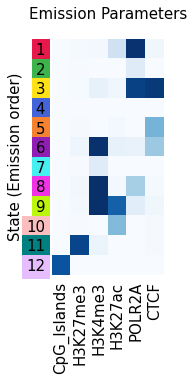

In [11]:
show_emission_graph()

### [Optional] Semantic Analysis 

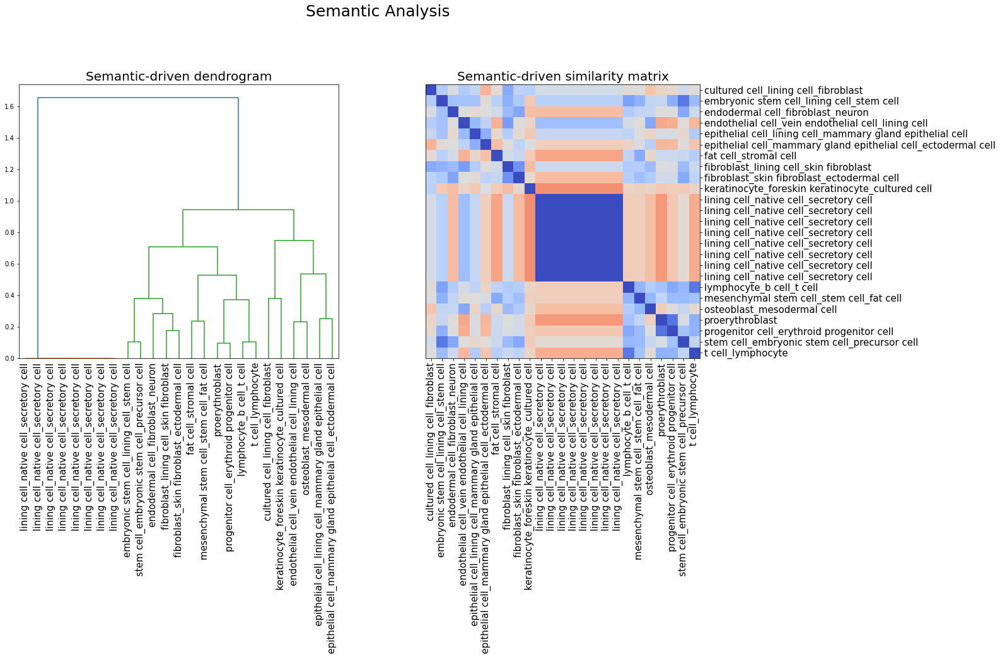

In [12]:
plot_semantic_graphs(semantic_df, pool)

### Single Gene Analysis 

In [13]:
states_df = load_states_dataframe()

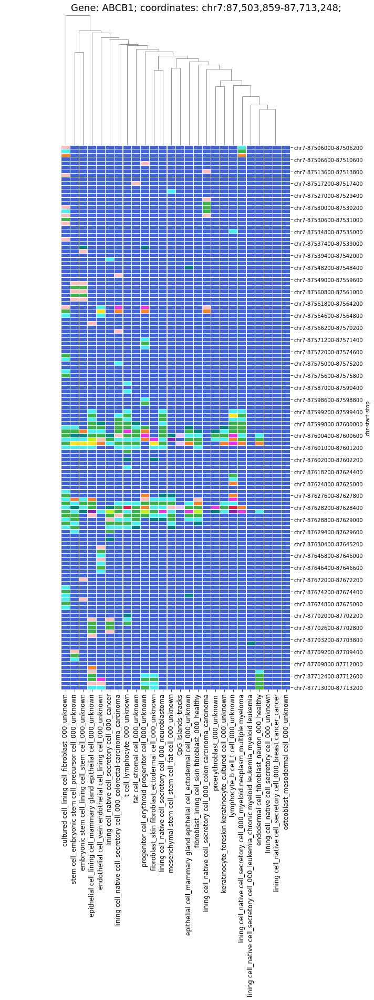

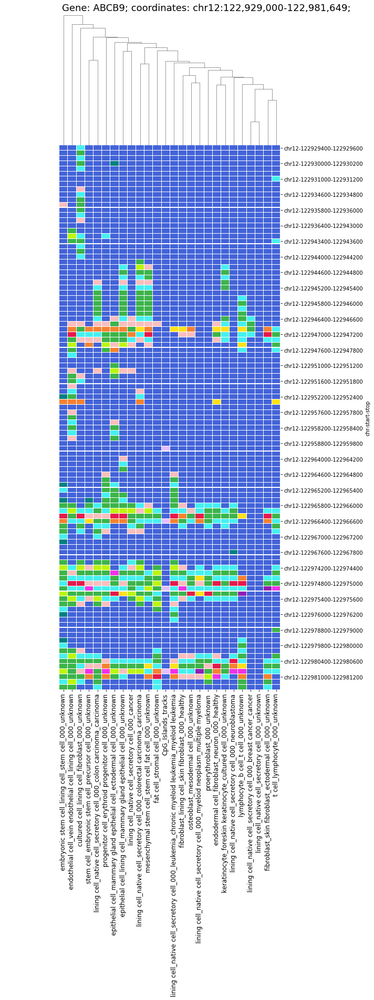

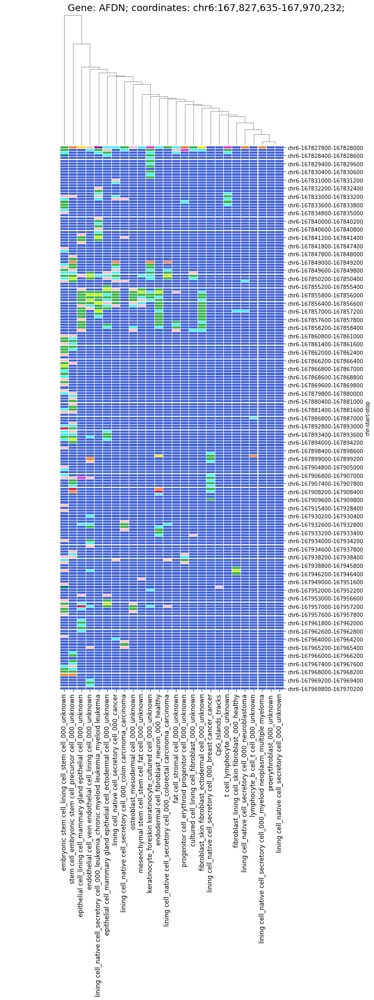

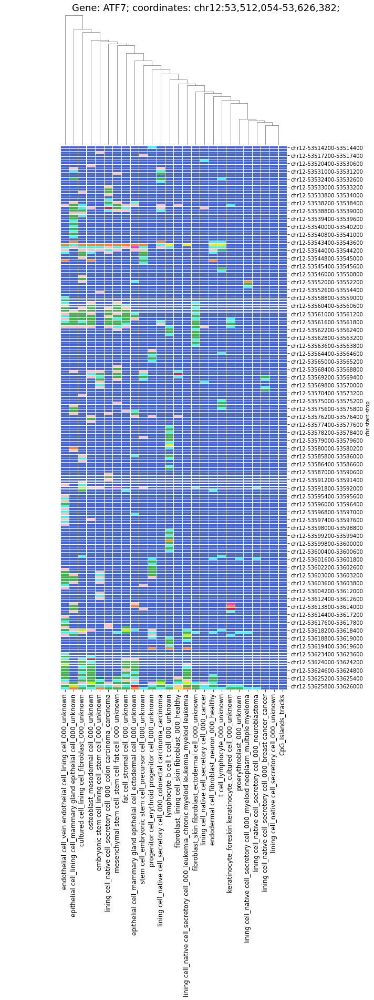

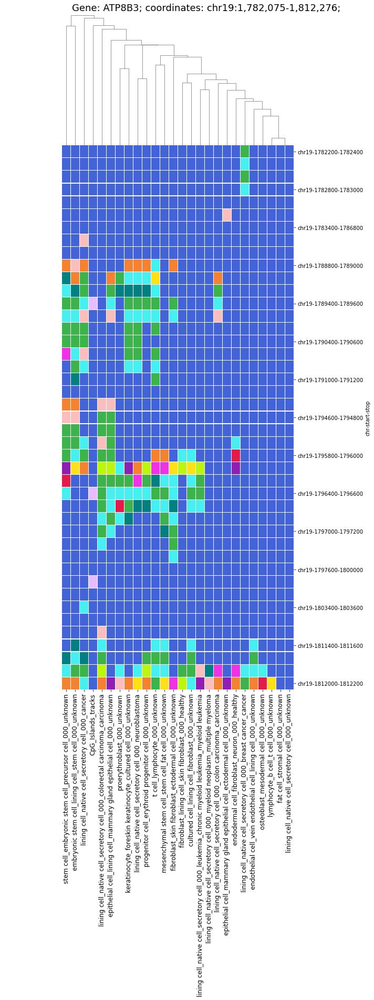

...

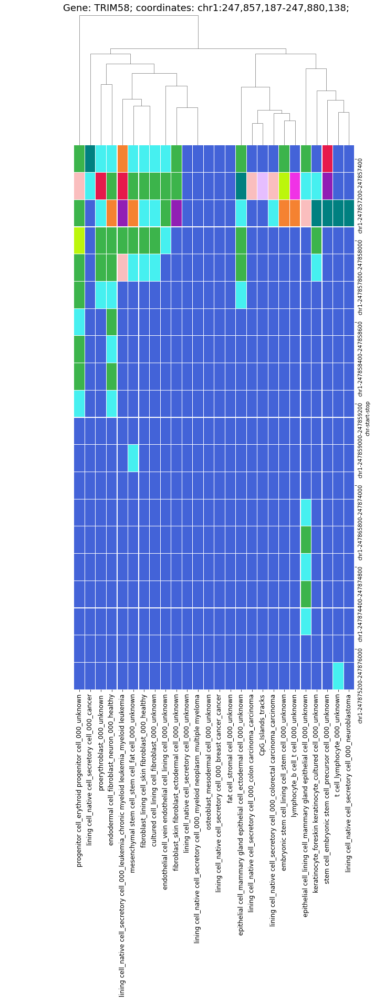

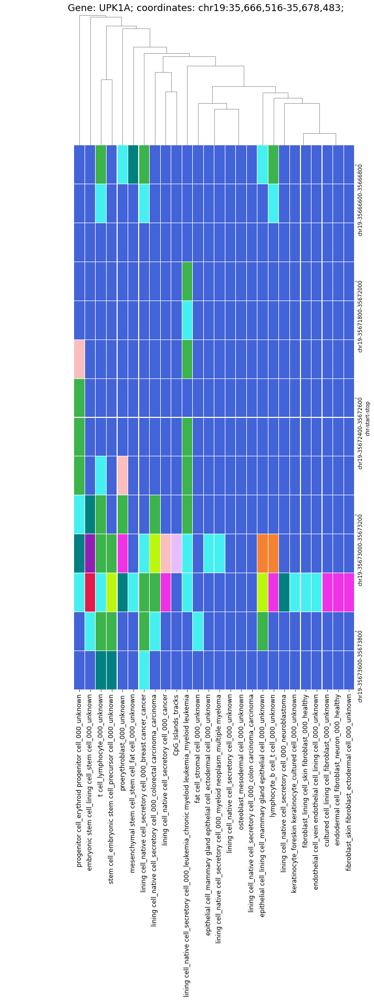

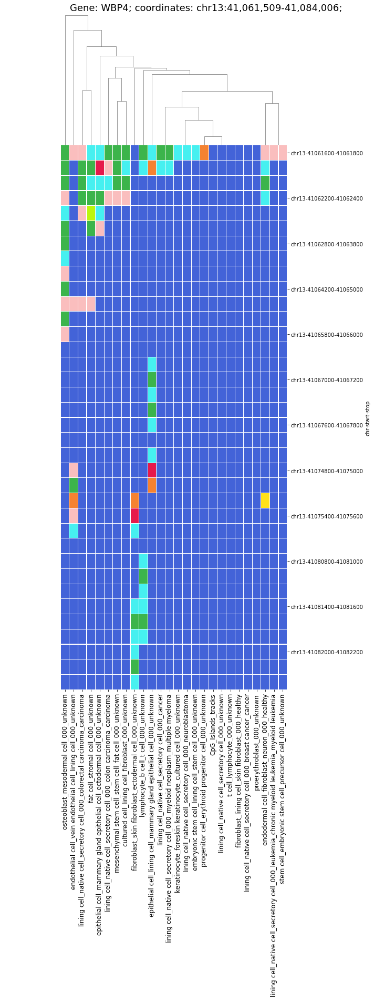

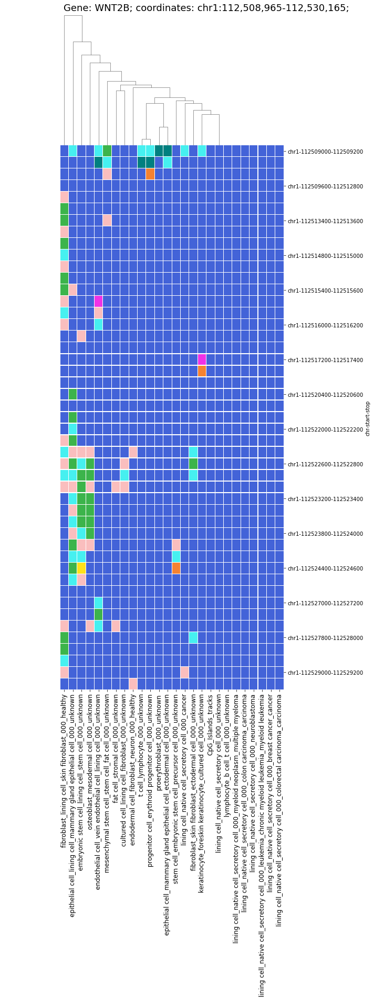

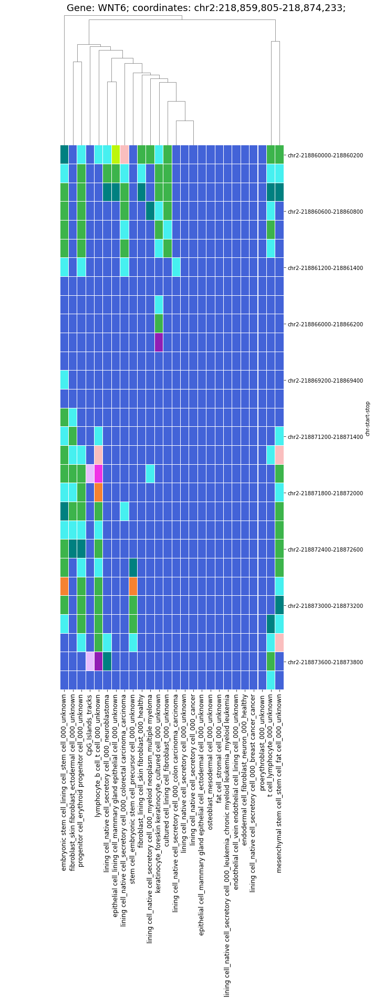

In [14]:
single_gene_analysis(states_df, "./input_files/gene_list.txt")

### Whole Genome Analysis 

In [15]:
reducted_df = genome_reduction(states_df)

 chrY  

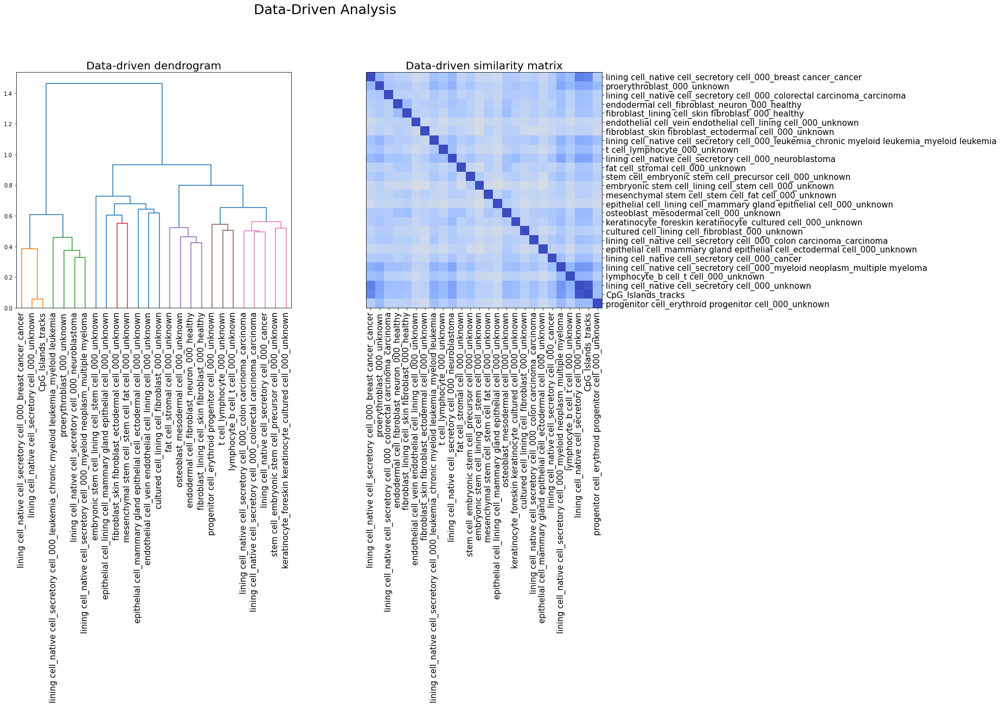

In [16]:
plot_data_graphs(reducted_df, pool)

### Genome-wide analysis

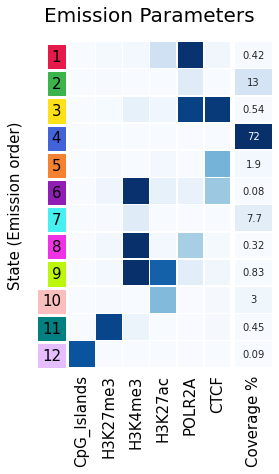

In [17]:
show_emission_graph_with_coverage(reducted_df)

a toatal of 9 clusters were indentified


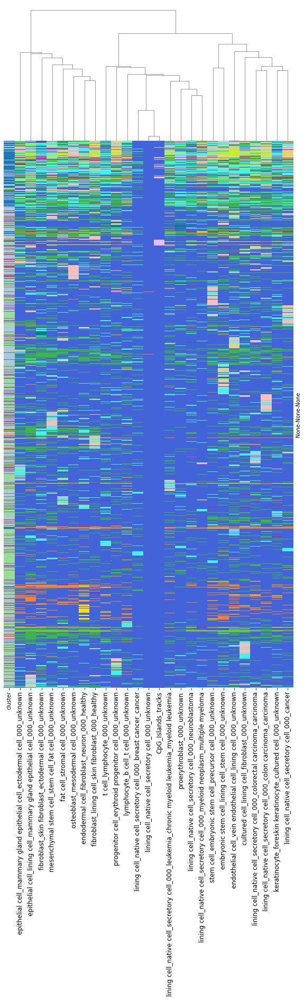

In [18]:
clustered_heatmap = data_driven_heatmap(reducted_df, minimum_cluster_size=20)

  EXISTS: go-basic.obo
  EXISTS: gene2go
go-basic.obo: fmt(1.2) rel(2021-02-01) 47,291 GO Terms
HMS:0:00:06.853191 335,839 annotations, 20,674 genes, 18,442 GOs, 1 taxids READ: gene2go 
MF 18,158 annotated human genes
CC 19,390 annotated human genes
BP 18,660 annotated human genes

Load BP Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
 87% 16,974 of 19,606 population items found in association

Load CC Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
 91% 17,923 of 19,606 population items found in association

Load MF Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
 89% 17,440 of 19,606 population items found in association
querying 1-1000...done.
querying 1001-2000...done.
querying 2001-3000...done.
querying 3001-4000...done.
querying 4001-5000...done.
querying 5001-5313...done.
Finished.
664 input query terms found dup hits:
	[('AURKAI

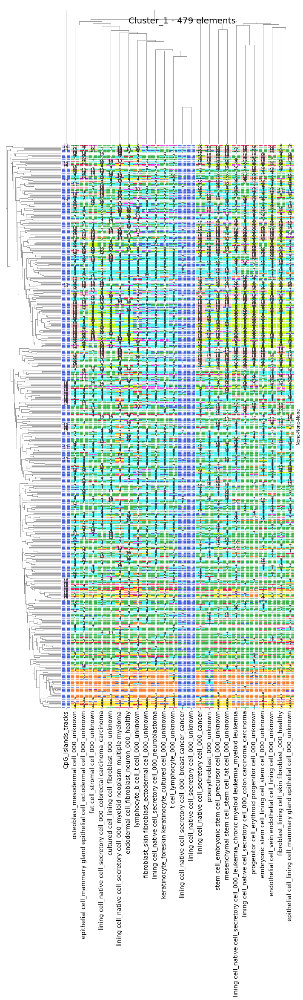

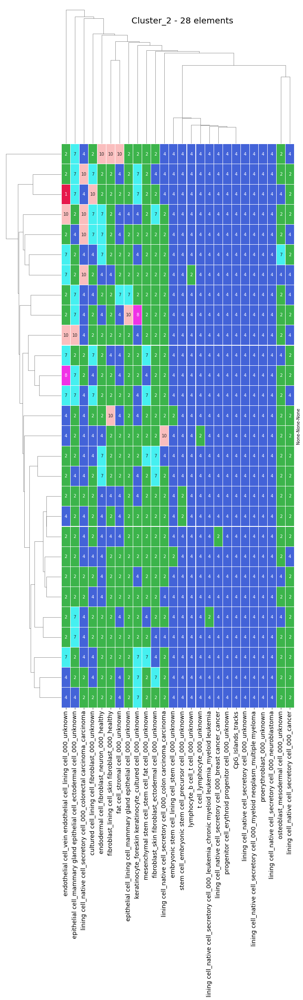

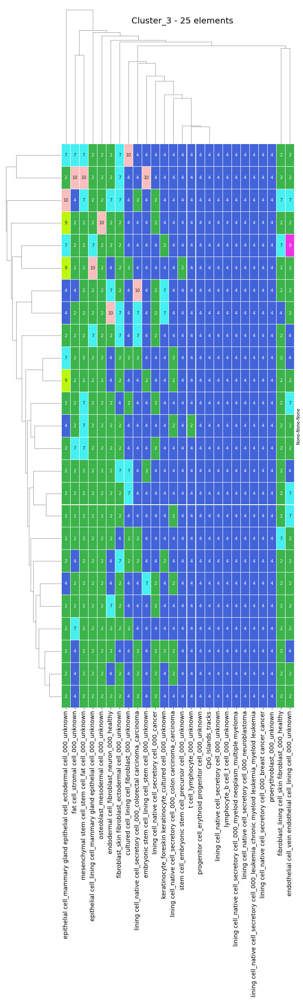

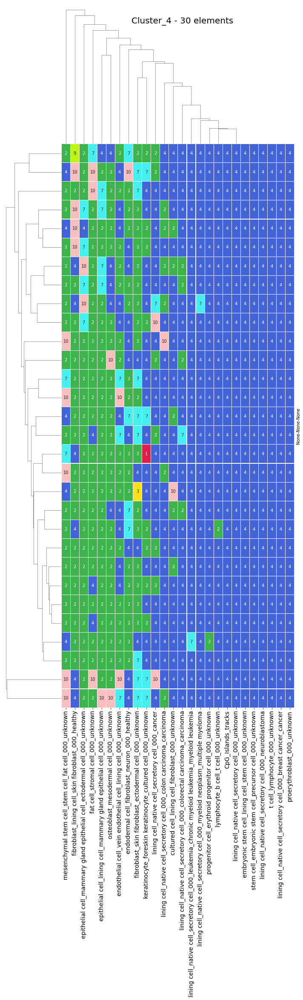

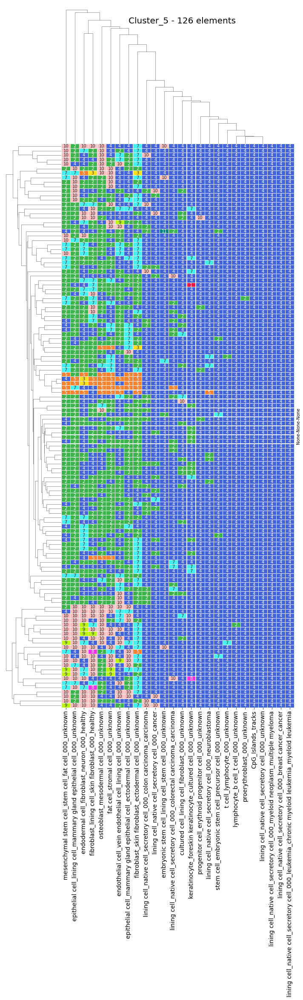

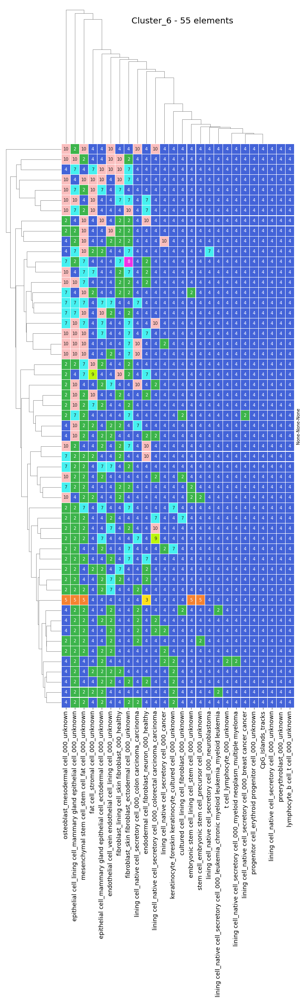

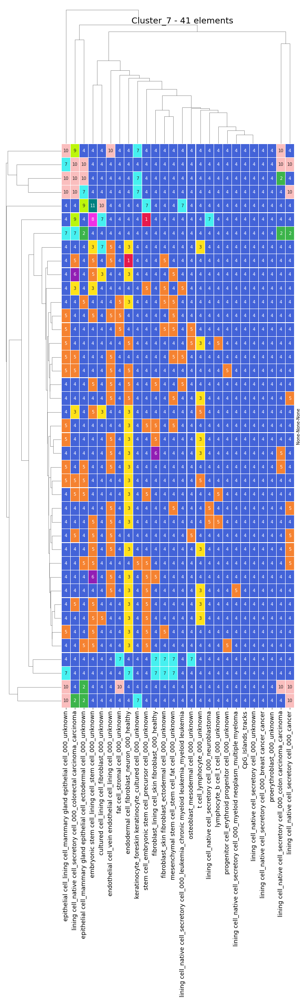

In [25]:
gene_ontology_enrichment_analysis(clustered_heatmap, reducted_df, sig_cut_off= 0.05)